# Plotting Animations of Land Cover

Let's plot pretty Land Cover Animations! Plotting animations of Land Cover over a specific area allows users to see the change occuring in the development of that landscape. An animation is a great way to odentify trends of change in a landscape, such a the expantion of urban areas in our cities. This notebook steps throuh using the lc_animation module demonstrating the different options for createing animations.

## Description
This notebook demonstrates how to:

1. Load a time series of DEA Land COv as an `xarray` dataset
2. Plot the data as a three band time series animation 
3. Plot the data as a one band time series animation
3. Export the resulting animations as either a GIF or MP4 file
4. Add custom vector overlays
5. Apply custom image processing functions to each animation frame

***

### Load Packages

In [1]:
%matplotlib inline

import math
import sys
import os

import datacube
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr

sys.path.insert(1, os.path.abspath('../Tools'))
from dea_tools.plotting import display_map
from dea_tools.land_cover import lc_animation


### Connect to the datacube

In [2]:
dc = datacube.Datacube(app='land_cover_animation')

## Load Land Cover data from the datacube

### Select area of interest

In [3]:
# lake Wallawalla
point_x, point_y = (-28.7448, 147.9323)


lat = (point_x - 0.1, point_x + 0.2)
lon = (point_y - 0.3, point_y + 0.2)

# display area on map
display_map(x=lon, y=lat)

### Build query and load data

In [4]:
query = {
    "y": lat,
    "x": lon,
    "time": ("1988", "2021"),}

# Load DEA Land Cover data from the datacube
land_cover_data = dc.load(
    product="ga_ls_landcover_class_cyear_2",
    #              crs = "EPSG:3577",
    output_crs="EPSG:3577",
    measurements=["level3", "level4", "canopyco_veg_cat_l4d"],
    resolution=(-25, 25),
    **query)

In [5]:
land_cover_data

<xarray.Dataset>
Dimensions:               (time: 33, y: 1576, x: 2084)
Coordinates:
  * time                  (time) datetime64[ns] 1988-01-01 ... 2020-01-01
  * y                     (y) float64 -3.192e+06 -3.193e+06 ... -3.232e+06
  * x                     (x) float64 1.504e+06 1.504e+06 ... 1.556e+06
    spatial_ref           int32 3577
Data variables:
    level3                (time, y, x) uint8 112 112 112 112 ... 112 112 112 112
    level4                (time, y, x) int8 34 34 34 34 34 34 ... 34 34 34 34 34
    canopyco_veg_cat_l4d  (time, y, x) int8 13 13 13 13 13 13 ... 13 13 13 13 13
Attributes:
    crs:           EPSG:3577
    grid_mapping:  spatial_ref

## Plot Animation 

In [6]:
#define a file name to save as

file_name = 'and_stacked_plot'

In [7]:
# plot animation using level 3

level_3 = land_cover_data["level3"]

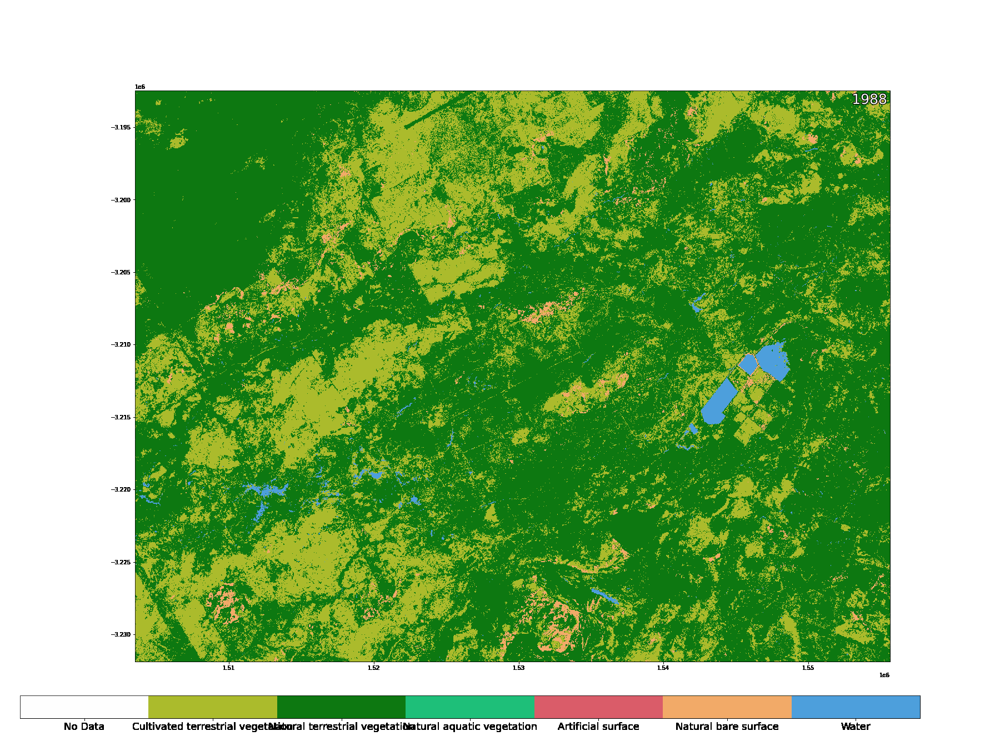

In [8]:
lc_animation(level_3, layer="level3", file_name=file_name, stacked_plot=False)

In [9]:
#now plot level 4

## Plot Animation with a stacked line plot

this stacked line plot shows what percentage of the animated map is classified into each class.

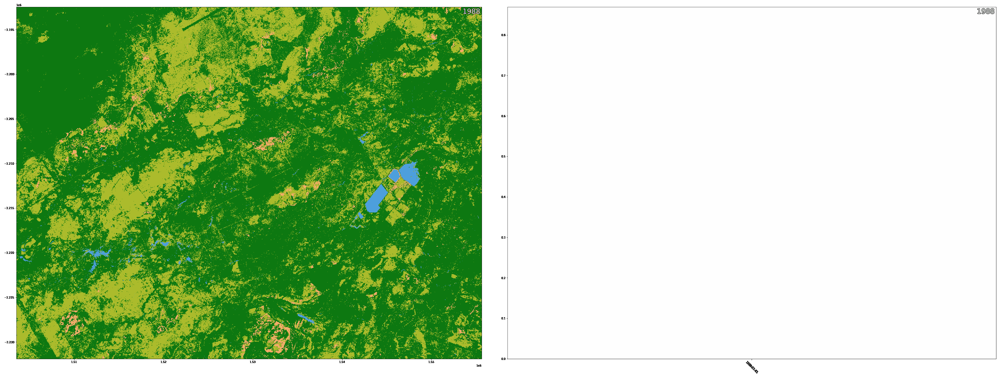

In [10]:
# do a grovy stack plot side by side
lc_animation(level_3, layer="level3", file_name=file_name, stacked_plot=True)

## Plot two maps side by side

maybe you want to look at how the entier landscape changes and also focus on a particular feature such as water or bare? 